<a href="https://colab.research.google.com/github/pradobruno/IA_Teleconsultas/blob/main/Codigo_atualizado.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Projeto: Análise Emocional Facial com IA para Teleconsultas
# Autores: Maraysa Vaanessa & Bruno


In [ ]:
!pip install -q tensorflow keras

In [ ]:
# MODELO PRÉ-TREINADO (.h5)
!wget -nc https://github.com/SajalSinha/Facial-Emotion-Recognition/raw/main/FER_model.h5

--2025-05-21 22:04:46--  https://github.com/SajalSinha/Facial-Emotion-Recognition/raw/main/FER_model.h5
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/SajalSinha/Facial-Emotion-Recognition/main/FER_model.h5 [following]
--2025-05-21 22:04:47--  https://raw.githubusercontent.com/SajalSinha/Facial-Emotion-Recognition/main/FER_model.h5
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 16139272 (15M) [application/octet-stream]
Saving to: ‘FER_model.h5’

FER_model.h5        100%[===================>]  15.39M  --.-KB/s    in 0.1s    

2025-05-21 22:04:47 (115 MB/s) - ‘FER_model.h5’ saved [16139272/16139

In [ ]:
# BIBLIOTECAS
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import drive
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array
import os

In [ ]:
# 🔹 3. MONTAR GOOGLE DRIVE
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# CAMINHOS DOS ARQUIVOS
cascade_faces = "/content/drive/MyDrive/Fasesemocoes2/haarcascade_frontalface_default.xml"
modelo_emocoes = "FER_model.h5"
imagem_path = "/content/drive/MyDrive/Fasesemocoes2/Fotos/happy.png"

In [ ]:
#  CARREGAR O CLASSIFICADOR E O MODELO
face_detection = cv2.CascadeClassifier(cascade_faces)
classificador_emocoes = load_model(modelo_emocoes, compile=False)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
#  LABELS DE EMOÇÕES (modelo do GitHub usa essas 7)
expressoes = ['angry', 'disgust', 'fear', 'happy', 'sad', 'surprise', 'neutral']


In [ ]:
#  CARREGAR IMAGEM
imagem = cv2.imread(imagem_path)

if imagem is None:
    print("❌ Erro ao carregar a imagem.")
else:
    original = imagem.copy()
    cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

In [ ]:
# . DETECTAR ROSTOS
faces = face_detection.detectMultiScale(
        cinza, scaleFactor=1.1, minNeighbors=3, minSize=(20, 20)
    )

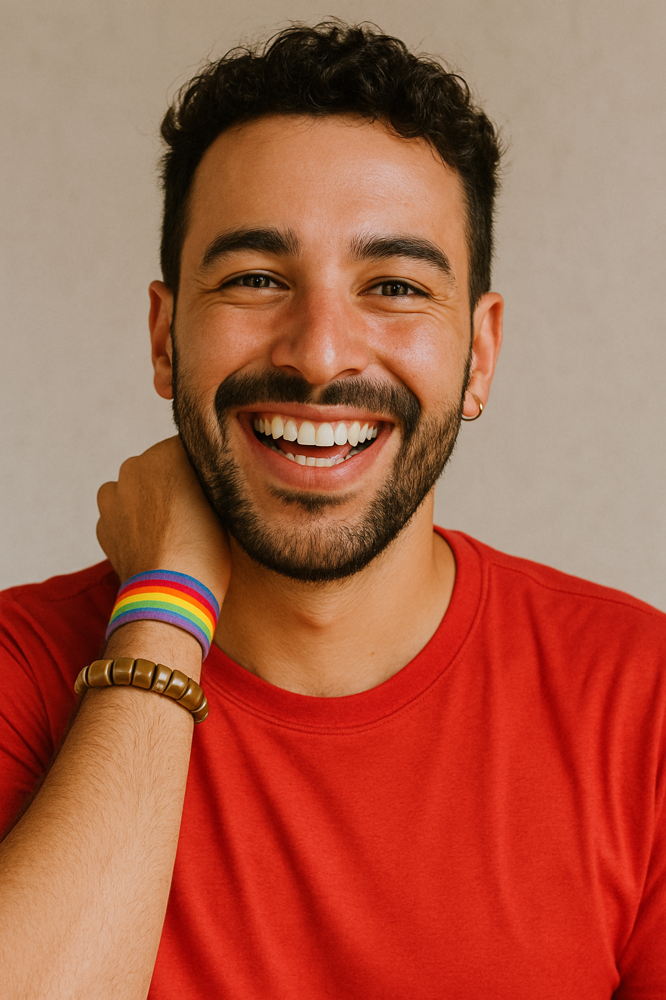

In [ ]:
 # Mostrar imagem original
 cv2_imshow(imagem)

In [ ]:
# FAZER PREVISÃO EMOCIONAL
if len(faces) == 0:
    print("😐 Nenhum rosto detectado.")
else:
    for (x, y, w, h) in faces:
        roi = cinza[y:y+h, x:x+w]
        roi = cv2.resize(roi, (48, 48))
        roi = roi.astype("float") / 255.0
        roi = img_to_array(roi)
        roi = np.expand_dims(roi, axis=0)

        preds = classificador_emocoes.predict(roi)[0]
        label = expressoes[np.argmax(preds)]
        prob = np.max(preds)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 792ms/step


In [ ]:
        # Anotação da imagem
        cv2.putText(imagem, f"{label} ({prob*100:.2f}%)", (x, y - 10),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)
        cv2.rectangle(imagem, (x, y), (x + w, y + h), (0, 0, 255), 2)
        print(f"Emoção detectada: {label} com {prob*100:.2f}% de confiança")

Emoção detectada: happy com 97.87% de confiança


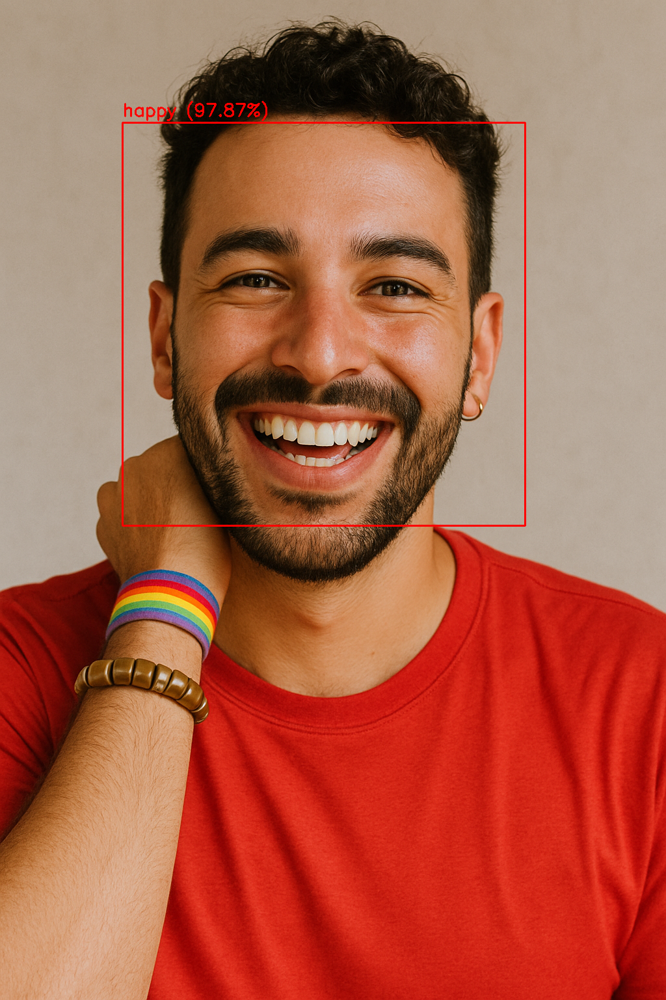

In [ ]:
       # Mostrar imagem anotada
       cv2_imshow(imagem)

Parte 1 — Instalar dlib e **imutils**

In [ ]:
!pip install -q dlib imutils


In [ ]:
!wget -nc http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
!bzip2 -dk shape_predictor_68_face_landmarks.dat.bz2

#Baixar direto do site do dlib:

--2025-05-21 22:05:25--  http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Resolving dlib.net (dlib.net)... 107.180.26.78
Connecting to dlib.net (dlib.net)|107.180.26.78|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2 [following]
--2025-05-21 22:05:25--  https://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Connecting to dlib.net (dlib.net)|107.180.26.78|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 64040097 (61M)
Saving to: ‘shape_predictor_68_face_landmarks.dat.bz2’

shape_predictor_68_ 100%[===================>]  61.07M  36.8MB/s    in 1.7s    

2025-05-21 22:05:27 (36.8 MB/s) - ‘shape_predictor_68_face_landmarks.dat.bz2’ saved [64040097/64040097]



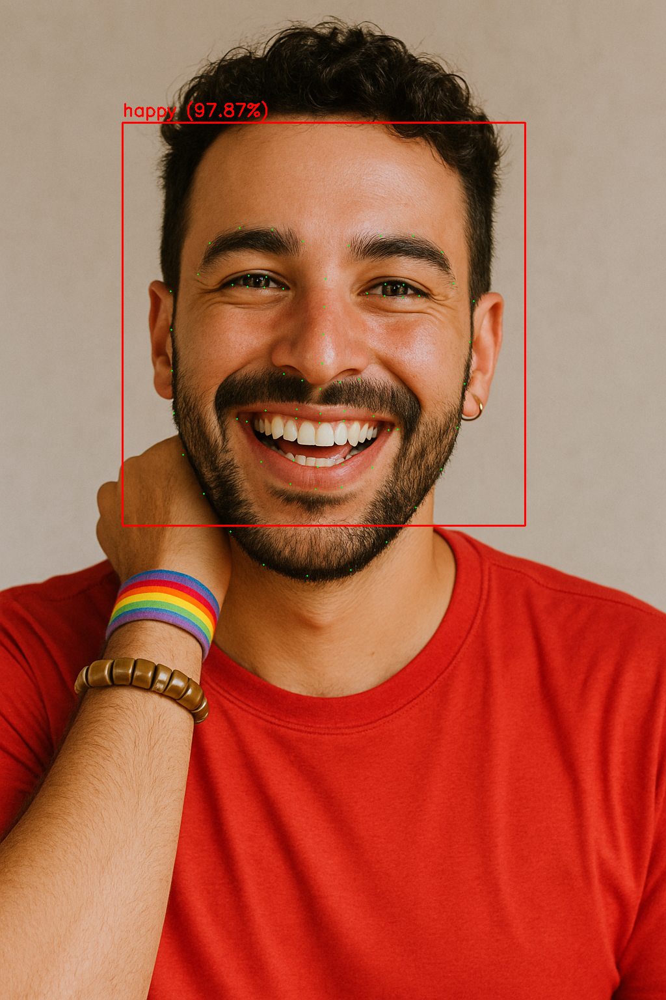

In [ ]:
import dlib
import imutils

# Carregar o preditor de pontos faciais
preditordeforma = dlib.shape_predictor("shape_predictor_68_face_landmarks.dat")
detector_dlib = dlib.get_frontal_face_detector()

# Converter a imagem para RGB (o dlib trabalha em RGB)
imagem_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
rostos_dlib = detector_dlib(imagem_rgb, 1)

# Desenhar os pontos
for rosto in rostos_dlib:
    shape = preditordeforma(imagem_rgb, rosto)
    for i in range(0, 68):
        ponto = (shape.part(i).x, shape.part(i).y)
        cv2.circle(imagem, ponto, 1, (0, 255, 0), -1)

# Mostrar imagem com os pontos desenhados
cv2_imshow(imagem)


In [ ]:
preds = classificador_emocoes.predict(roi)[0]
label = expressoes[np.argmax(preds)]
prob = np.max(preds)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


In [ ]:
# INTERPRETAÇÃO CLÍNICA SIMPLES
interpretacao = ""

if label == "sad":
    interpretacao = "➡️ Indícios de tristeza significativa. Sugere-se atenção a sinais de depressão."
elif label == "angry":
    interpretacao = "⚠️ Emoção de raiva detectada. Pode indicar estresse ou frustração."
elif label == "fear":
    interpretacao = "⚠️ Emoção de medo. Potencial sinal de ansiedade ou tensão emocional."
elif label == "happy":
    interpretacao = "😊 Emoção positiva predominante. Indica bom estado emocional."
elif label == "neutral":
    interpretacao = "😐 Expressão neutra. Pode indicar calma ou ausência de estímulo emocional claro."
elif label == "surprise":
    interpretacao = "😮 Surpresa detectada. Associada a reações inesperadas ou novidade."
elif label == "disgust":
    interpretacao = "⚠️ Emoção de nojo. Pode refletir repulsa ou desconforto."

# Exibir a interpretação no console
print("📋 Interpretação clínica:")
print(interpretacao)


📋 Interpretação clínica:
😊 Emoção positiva predominante. Indica bom estado emocional.


In [ ]:
# Criar texto do relatório

nome = os.path.splitext(os.path.basename(imagem_path))[0]

relatorio = f"""
📄 RELATÓRIO DE ANÁLISE EMOCIONAL
--------------------------------------
📷 Imagem: {nome}
🧠 Emoção detectada: {label}
🎯 Confiança: {prob*100:.2f}%

📊 Probabilidades de todas as emoções:
"""

for i, p in enumerate(preds):
    relatorio += f"• {expressoes[i]}: {p*100:.2f}%\n"

relatorio += f"\n📋 Interpretação clínica:\n{interpretacao}\n"

# Criar pasta de resultados
output_dir = "/content/drive/MyDrive/Fasesemocoes2/relatorios"
os.makedirs(output_dir, exist_ok=True)

# Salvar o arquivo
caminho_relatorio = os.path.join(output_dir, f"{nome}_relatorio.txt")
with open(caminho_relatorio, "w") as f:
    f.write(relatorio)

print(f"✅ Relatório salvo em: {caminho_relatorio}")


✅ Relatório salvo em: /content/drive/MyDrive/Fasesemocoes2/relatorios/happy_relatorio.txt


In [ ]:
!pip install -q gradio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.2/54.2 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.1/323.1 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 4.3 MB/s eta 0:00:00


In [ ]:
import gradio as gr
import matplotlib.pyplot as plt
import traceback

In [ ]:
# Caminhos
cascade_faces = "/content/drive/MyDrive/Fasesemocoes2/haarcascade_frontalface_default.xml"
modelo_emocoes = "FER_model.h5"
modelo_landmark = "shape_predictor_68_face_landmarks.dat"

# Carregar modelo e classificador
face_detection = cv2.CascadeClassifier(cascade_faces)
classificador_emocoes = load_model(modelo_emocoes, compile=False)
pontos_preditor = dlib.shape_predictor(modelo_landmark)
detector_dlib = dlib.get_frontal_face_detector()

expressoes = ['angry', 'disgust', 'fear', 'happy', 'sad', 'surprise', 'neutral']

# Função de interpretação clínica
def interpretar(label):
    if label == "sad":
        return "➡️ Indícios de tristeza significativa. Sugere-se atenção a sinais de depressão."
    elif label == "angry":
        return "⚠️ Emoção de raiva detectada. Pode indicar estresse ou frustração."
    elif label == "fear":
        return "⚠️ Emoção de medo. Potencial sinal de ansiedade ou tensão emocional."
    elif label == "happy":
        return "😊 Emoção positiva predominante. Indica bom estado emocional."
    elif label == "neutral":
        return "😐 Expressão neutra. Pode indicar calma ou ausência de estímulo emocional claro."
    elif label == "surprise":
        return "😮 Surpresa detectada. Associada a reações inesperadas ou novidade."
    elif label == "disgust":
        return "⚠️ Emoção de nojo. Pode refletir repulsa ou desconforto."
    else:
        return "🧠 Interpretação não disponível."

# Função principal do app
def analisar_emocao(imagem_input):
    imagem = cv2.cvtColor(imagem_input, cv2.COLOR_RGB2BGR)
    original = imagem.copy()
    cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)
    faces = face_detection.detectMultiScale(cinza, 1.1, 3)

    if len(faces) == 0:
        return imagem_input, "Nenhum rosto detectado", plt.figure()

    (x, y, w, h) = faces[0]
    roi = cinza[y:y+h, x:x+w]
    roi = cv2.resize(roi, (48, 48))
    roi = roi.astype("float") / 255.0
    roi = img_to_array(roi)
    roi = np.expand_dims(roi, axis=0)

    preds = classificador_emocoes.predict(roi)[0]
    label = expressoes[np.argmax(preds)]
    prob = np.max(preds)
    interpretacao = interpretar(label)

    # Anotar a imagem
    cv2.rectangle(imagem, (x, y), (x+w, y+h), (0, 0, 255), 2)
    cv2.putText(imagem, f"{label} ({prob*100:.2f}%)", (x, y - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    # Adicionar landmarks
    img_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
    rostos_dlib = detector_dlib(img_rgb, 1)
    for rosto in rostos_dlib:
        shape = pontos_preditor(img_rgb, rosto)
        for i in range(68):
            ponto = (shape.part(i).x, shape.part(i).y)
            cv2.circle(imagem, ponto, 1, (0, 255, 0), -1)

    # Gerar gráfico
    fig, ax = plt.subplots(figsize=(6, 3))
    ax.bar(expressoes, preds, color='skyblue')
    ax.set_title("Distribuição das emoções")
    ax.set_ylim([0, 1])
    plt.tight_layout()

    # Converte imagem BGR para RGB antes de exibir no Gradio
    imagem_rgb = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

    return imagem_rgb, interpretacao, fig

# Interface Gradio
gr.Interface(
    fn=analisar_emocao,
    inputs=gr.Image(type="numpy", label="Envie uma imagem facial"),
    outputs=[
        gr.Image(type="numpy", label="Resultado com Detecção"),
        gr.Text(label="Interpretação clínica"),
        gr.Plot(label="Gráfico de Probabilidades")
    ],
    title="IA na Teleconsulta",
    description="Análise emocional automática com interpretação clínica assistiva"
).launch(debug=False)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


It looks like you are running Gradio on a hosted a Jupyter notebook. For the Gradio app to work, sharing must be enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://ecd8278aab8a174a10.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [ ]:
# Caminhos
cascade_faces = "/content/drive/MyDrive/Fasesemocoes2/haarcascade_frontalface_default.xml"
modelo_emocoes = "FER_model.h5"
modelo_landmark = "shape_predictor_68_face_landmarks.dat"

# Carregar modelo e classificador
face_detection = cv2.CascadeClassifier(cascade_faces)
classificador_emocoes = load_model(modelo_emocoes, compile=False)
pontos_preditor = dlib.shape_predictor(modelo_landmark)
detector_dlib = dlib.get_frontal_face_detector()

expressoes = ['angry', 'disgust', 'fear', 'happy', 'sad', 'surprise', 'neutral']

# Função de interpretação clínica
def interpretar(label):
    if label == "sad":
        return "➡️ Indícios de tristeza significativa. Sugere-se atenção a sinais de depressão."
    elif label == "angry":
        return "⚠️ Emoção de raiva detectada. Pode indicar estresse ou frustração."
    elif label == "fear":
        return "⚠️ Emoção de medo. Potencial sinal de ansiedade ou tensão emocional."
    elif label == "happy":
        return "😊 Emoção positiva predominante. Indica bom estado emocional."
    elif label == "neutral":
        return "😐 Expressão neutra. Pode indicar calma ou ausência de estímulo emocional claro."
    elif label == "surprise":
        return "😮 Surpresa detectada. Associada a reações inesperadas ou novidade."
    elif label == "disgust":
        return "⚠️ Emoção de nojo. Pode refletir repulsa ou desconforto."
    else:
        return "🧠 Interpretação não disponível."

# Função principal do app
def analisar_emocao(imagem_input):
    imagem = cv2.cvtColor(imagem_input, cv2.COLOR_RGB2BGR)
    original = imagem.copy()
    cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)
    faces = face_detection.detectMultiScale(cinza, 1.1, 3)

    if len(faces) == 0:
        return imagem_input, "Nenhum rosto detectado", plt.figure()

    (x, y, w, h) = faces[0]
    roi = cinza[y:y+h, x:x+w]
    roi = cv2.resize(roi, (48, 48))
    roi = roi.astype("float") / 255.0
    roi = img_to_array(roi)
    roi = np.expand_dims(roi, axis=0)

    preds = classificador_emocoes.predict(roi)[0]
    label = expressoes[np.argmax(preds)]
    prob = np.max(preds)
    interpretacao = interpretar(label)

    # Anotar a imagem
    cv2.rectangle(imagem, (x, y), (x+w, y+h), (0, 0, 255), 2)
    cv2.putText(imagem, f"{label} ({prob*100:.2f}%)", (x, y - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    # Adicionar landmarks
    img_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
    rostos_dlib = detector_dlib(img_rgb, 1)
    for rosto in rostos_dlib:
        shape = pontos_preditor(img_rgb, rosto)
        for i in range(68):
            ponto = (shape.part(i).x, shape.part(i).y)
            cv2.circle(imagem, ponto, 1, (0, 255, 0), -1)

    # Gerar gráfico
    fig, ax = plt.subplots(figsize=(6, 3))
    ax.bar(expressoes, preds, color='skyblue')
    ax.set_title("Distribuição das emoções")
    ax.set_ylim([0, 1])
    plt.tight_layout()

    # Converte imagem BGR para RGB antes de exibir no Gradio
    imagem_rgb = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

    return imagem_rgb, interpretacao, fig

# Interface Gradio
gr.Interface(
    fn=analisar_emocao,
    inputs=gr.Image(type="numpy", label="Envie uma imagem facial"),
    outputs=[
        gr.Image(type="numpy", label="Resultado com Detecção"),
        gr.Text(label="Interpretação clínica"),
        gr.Plot(label="Gráfico de Probabilidades")
    ],
    title="AIA na Teleconsulta",
    description="Análise emocional automática com interpretação clínica assistiva"
).launch(debug=False)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


It looks like you are running Gradio on a hosted a Jupyter notebook. For the Gradio app to work, sharing must be enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://2e638c97d62dc9e305.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [ ]:
# Caminhos
cascade_faces = "/content/drive/MyDrive/Fasesemocoes2/haarcascade_frontalface_default.xml"
modelo_emocoes = "FER_model.h5"
modelo_landmark = "shape_predictor_68_face_landmarks.dat"

# Carregar modelo e classificador
face_detection = cv2.CascadeClassifier(cascade_faces)
classificador_emocoes = load_model(modelo_emocoes, compile=False)
pontos_preditor = dlib.shape_predictor(modelo_landmark)
detector_dlib = dlib.get_frontal_face_detector()

expressoes = ['angry', 'disgust', 'fear', 'happy', 'sad', 'surprise', 'neutral']

# Função de interpretação clínica
def interpretar(label):
    if label == "sad":
        return "➡️ Indícios de tristeza significativa. Sugere-se atenção a sinais de depressão."
    elif label == "angry":
        return "⚠️ Emoção de raiva detectada. Pode indicar estresse ou frustração."
    elif label == "fear":
        return "⚠️ Emoção de medo. Potencial sinal de ansiedade ou tensão emocional."
    elif label == "happy":
        return "😊 Emoção positiva predominante. Indica bom estado emocional."
    elif label == "neutral":
        return "😐 Expressão neutra. Pode indicar calma ou ausência de estímulo emocional claro."
    elif label == "surprise":
        return "😮 Surpresa detectada. Associada a reações inesperadas ou novidade."
    elif label == "disgust":
        return "⚠️ Emoção de nojo. Pode refletir repulsa ou desconforto."
    else:
        return "🧠 Interpretação não disponível."

# Função principal do app
def analisar_emocao(imagem_input):
    imagem = cv2.cvtColor(imagem_input, cv2.COLOR_RGB2BGR)
    original = imagem.copy()
    cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)
    faces = face_detection.detectMultiScale(cinza, 1.1, 3)

    if len(faces) == 0:
        return imagem_input, "Nenhum rosto detectado", plt.figure()

    (x, y, w, h) = faces[0]
    roi = cinza[y:y+h, x:x+w]
    roi = cv2.resize(roi, (48, 48))
    roi = roi.astype("float") / 255.0
    roi = img_to_array(roi)
    roi = np.expand_dims(roi, axis=0)

    preds = classificador_emocoes.predict(roi)[0]
    label = expressoes[np.argmax(preds)]
    prob = np.max(preds)
    interpretacao = interpretar(label)

    # Anotar a imagem
    cv2.rectangle(imagem, (x, y), (x+w, y+h), (0, 0, 255), 2)
    cv2.putText(imagem, f"{label} ({prob*100:.2f}%)", (x, y - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    # Adicionar landmarks
    img_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
    rostos_dlib = detector_dlib(img_rgb, 1)
    for rosto in rostos_dlib:
        shape = pontos_preditor(img_rgb, rosto)
        for i in range(68):
            ponto = (shape.part(i).x, shape.part(i).y)
            cv2.circle(imagem, ponto, 1, (0, 255, 0), -1)

    # Gerar gráfico
    fig, ax = plt.subplots(figsize=(6, 3))
    ax.bar(expressoes, preds, color='skyblue')
    ax.set_title("Distribuição das emoções")
    ax.set_ylim([0, 1])
    plt.tight_layout()

    # Converte imagem BGR para RGB antes de exibir no Gradio
    imagem_rgb = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

    return imagem_rgb, interpretacao, fig

# Interface Gradio
gr.Interface(
    fn=analisar_emocao,
    inputs=gr.Image(type="numpy", label="Envie uma imagem facial"),
    outputs=[
        gr.Image(type="numpy", label="Resultado com Detecção"),
        gr.Text(label="Interpretação clínica"),
        gr.Plot(label="Gráfico de Probabilidades")
    ],
    title="AIA na Teleconsulta",
    description="Análise emocional automática com interpretação clínica assistiva"
).launch(debug=False)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


It looks like you are running Gradio on a hosted a Jupyter notebook. For the Gradio app to work, sharing must be enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://11acf347d0e2ebb470.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [ ]:
def avaliar_assimetria_facial(shape):
    pontos_esq = [shape.part(i) for i in range(0, 34)]
    pontos_dir = [shape.part(i) for i in range(34, 68)]

    dif_total = 0
    for p1, p2 in zip(pontos_esq, pontos_dir[::-1]):
        dx = abs(p1.x - p2.x)
        dif_total += dx

    assimetria_media = dif_total / len(pontos_esq)
    print(f"📐 Assimetria média: {assimetria_media:.2f}")

    if assimetria_media > 135:
        return "⚠️ Alerta: Possível assimetria facial detectada. Suspeita de AVC."
    else:
        return "✅ Simetria facial normal. Sem sinais visíveis de AVC."


📐 Assimetria média: 133.15


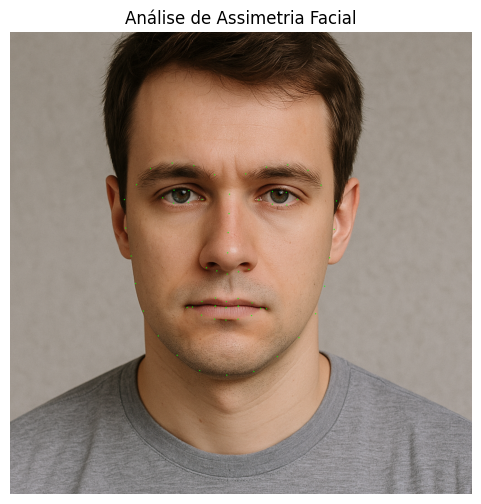

📋 Resultado: ✅ Simetria facial normal. Sem sinais visíveis de AVC.


In [ ]:
# Caminho da imagem que você quer testar
caminho_imagem = "/content/drive/MyDrive/Fasesemocoes2/Fotos/neutro.png"  # altere conforme a imagem

# Carregar e converter
img = cv2.imread(caminho_imagem)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Detectar rosto com dlib
rostos = detector_dlib(img_rgb, 1)

for rosto in rostos:
    shape = pontos_preditor(img_rgb, rosto)

    # Marcar os pontos
    for i in range(68):
        ponto = (shape.part(i).x, shape.part(i).y)
        cv2.circle(img_rgb, ponto, 1, (0, 255, 0), -1)

    # Avaliar assimetria
    resultado_avc = avaliar_assimetria_facial(shape)

# Mostrar imagem e resultado
plt.figure(figsize=(6, 6))
plt.imshow(img_rgb)
plt.axis('off')
plt.title("Análise de Assimetria Facial")
plt.show()

print("📋 Resultado:", resultado_avc)


📐 Assimetria média: 139.59


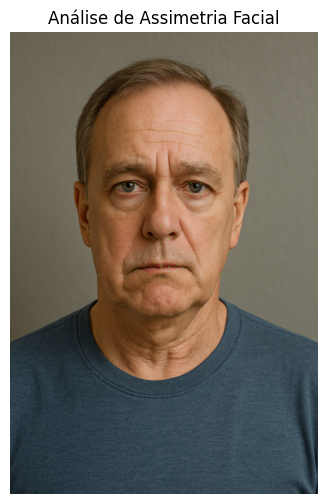

📋 Resultado: ⚠️ Alerta: Possível assimetria facial detectada. Suspeita de AVC.


In [ ]:
# Caminho da imagem que você quer testar
caminho_imagem = "/content/drive/MyDrive/Fasesemocoes2/Fotos/AVC.png"  # altere conforme a imagem

# Carregar e converter
img = cv2.imread(caminho_imagem)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Detectar rosto com dlib
rostos = detector_dlib(img_rgb, 1)

for rosto in rostos:
    shape = pontos_preditor(img_rgb, rosto)

    # Marcar os pontos
    for i in range(68):
        ponto = (shape.part(i).x, shape.part(i).y)
        cv2.circle(img_rgb, ponto, 1, (0, 255, 0), -1)

    # Avaliar assimetria
    resultado_avc = avaliar_assimetria_facial(shape)

# Mostrar imagem e resultado
plt.figure(figsize=(6, 6))
plt.imshow(img_rgb)
plt.axis('off')
plt.title("Análise de Assimetria Facial")
plt.show()

print("📋 Resultado:", resultado_avc)


📐 Assimetria média: 158.35


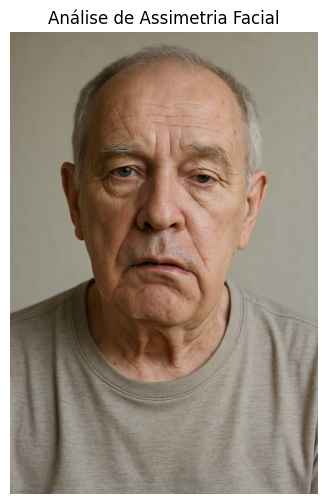

📋 Resultado: ⚠️ Alerta: Possível assimetria facial detectada. Suspeita de AVC.


In [ ]:
# Caminho da imagem
caminho_imagem = "/content/drive/MyDrive/Fasesemocoes2/Fotos/AVC2.png"  # altere conforme a imagem

# Carregar e converter
img = cv2.imread(caminho_imagem)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Detectar rosto com dlib
rostos = detector_dlib(img_rgb, 1)

for rosto in rostos:
    shape = pontos_preditor(img_rgb, rosto)

    # Marcar os pontos
    for i in range(68):
        ponto = (shape.part(i).x, shape.part(i).y)
        cv2.circle(img_rgb, ponto, 1, (0, 255, 0), -1)

    # Avaliar assimetria
    resultado_avc = avaliar_assimetria_facial(shape)

# Mostrar imagem e resultado
plt.figure(figsize=(6, 6))
plt.imshow(img_rgb)
plt.axis('off')
plt.title("Análise de Assimetria Facial")
plt.show()

print("📋 Resultado:", resultado_avc)
